In [3]:

import cv2
import math
import csv
import os
import matplotlib.pyplot as plt
from ultralytics import YOLO
from PIL import Image, ImageDraw, ImageFont
from ultralytics.solutions.solutions import BaseSolution
from ultralytics.utils.plotting import Annotator, colors
from datetime import datetime
%matplotlib inline

import ultralytics

https://www.digitalocean.com/community/tutorials/what-is-new-with-yolo

## EJERCICIO 1 
Vamos a usar el modleo YOLOv11 para detectar objetos en una imagen (en este caso vamos a aplicar el modelo directamente sin entrenarlo).
Vamos a aplicarlo en las imagenes deteccion_objetos.jpg y bus.jpg

Partiendo de la imagen deteccion_objetos.jpg y bus.jpg.




0: 640x640 11 persons, 7 bicycles, 4 cars, 2 fire hydrants, 132.0ms
1: 640x640 4 persons, 1 bus, 132.0ms
Speed: 6.5ms preprocess, 132.0ms inference, 4.9ms postprocess per image at shape (1, 3, 640, 640)


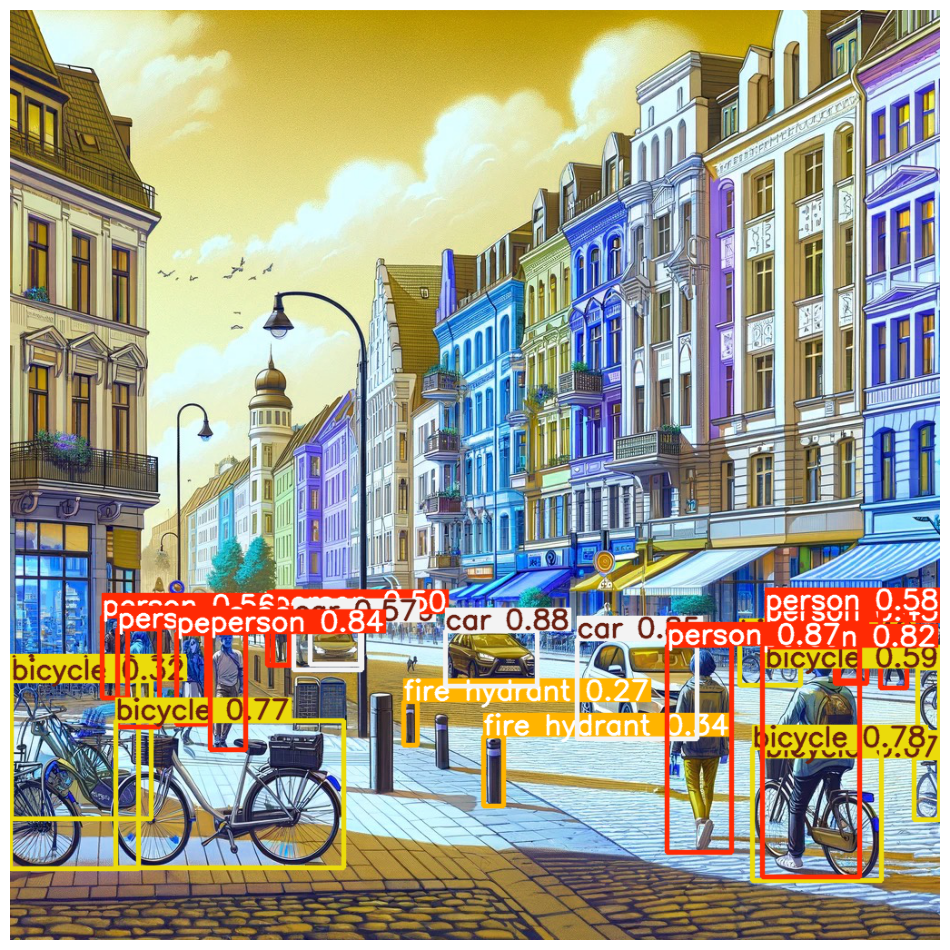

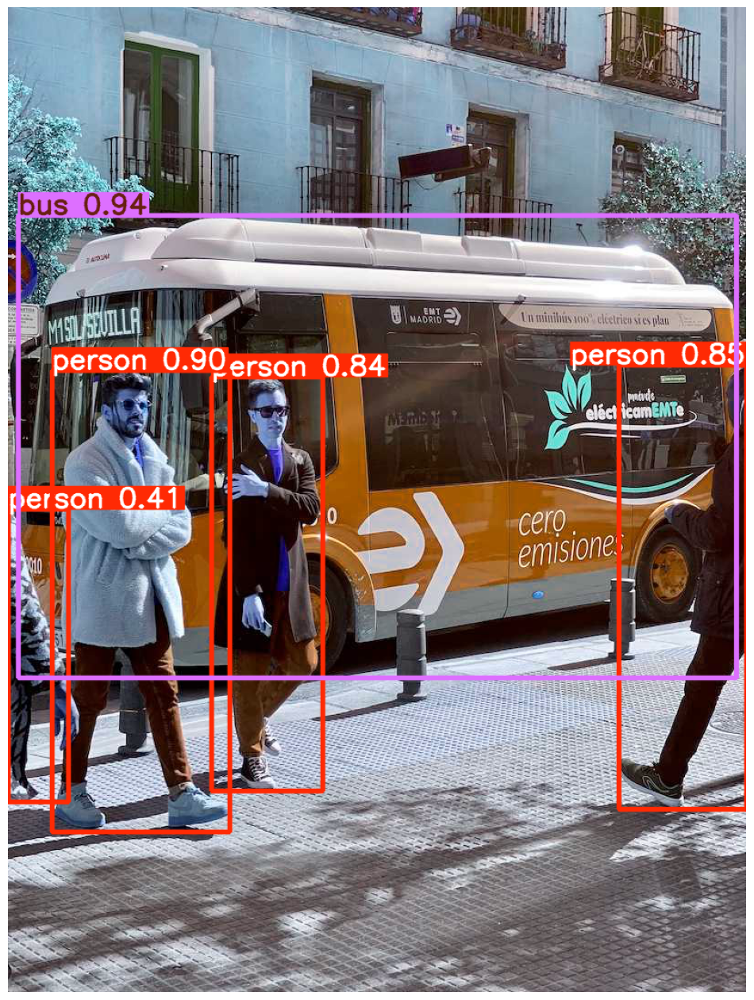

In [2]:
model = YOLO('yolo11n.pt')
image_paths = ["deteccion_objetos.jpg", "bus.jpg"]
results = model(image_paths)

for i,result in enumerate(results):
    image_with_boxes = results[i].plot()
    plt.figure(figsize=(12, 20)) 
    plt.imshow(image_with_boxes)
    plt.axis("off")  # Opcional: oculta los ejes
    plt.show()

## EJERCICIO 2
Vamos a repetir el ejercicio pero ahora vamos a modificar la salida para que quede de la siguiente forma:

![Imagen con la el resultado que se quiere obtener 1](Datos/deteccion_objetos_solucion.png)

![Imagen con la el resultado que se quiere obtener 1](Datos/bus_solucion.png)

Además sólo quiero que detecte los objetos cuya probabilidad sea mayor al 50%.

Ten en cuenta que al aplicar el modelo a una imagen devuelve diferentes datos:
 * Cajas:
    * Clase (cls)
    * Probabilidad (score)
    * Coordenadas de la caja xyxy

Para representar la imagen y añadir rectángulos, texto... puedes usar Image, ImageDraw, ImageFont de PIL. Dibujas la imagen con .Draw de (ImageDraw) con .rectangle y .text puedes ir añadiendo texto y rectángulos.


0: 640x640 11 persons, 7 bicycles, 4 cars, 2 fire hydrants, 86.3ms
1: 640x640 4 persons, 1 bus, 86.3ms
Speed: 2.5ms preprocess, 86.3ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


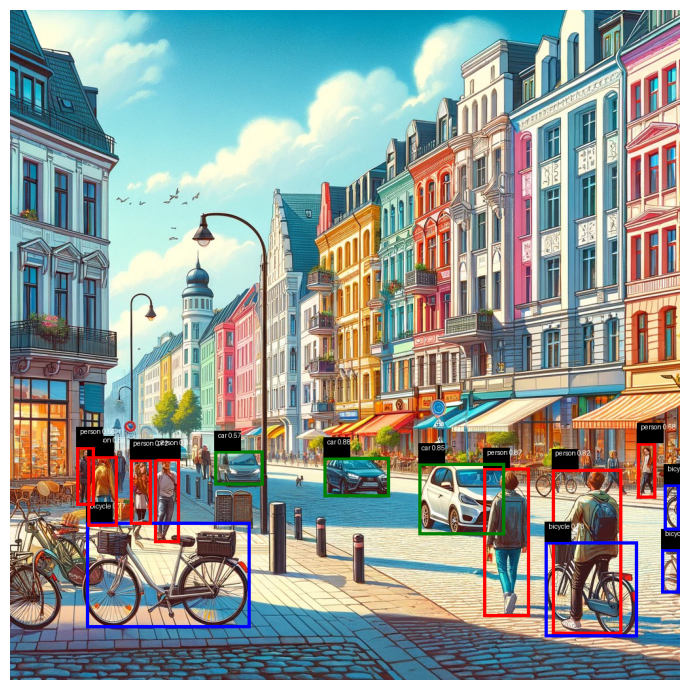

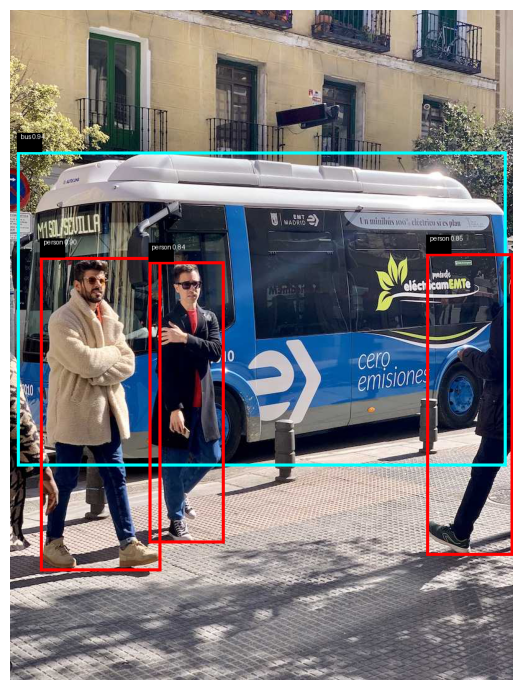

In [3]:
model = YOLO("yolo11n.pt")
image_paths = ["deteccion_objetos.jpg", "bus.jpg"]
results = model(image_paths)

for i, result in enumerate(results):
    detections = result.boxes
    filtered_detections = []

    for cls, score, box in zip(detections.cls, detections.conf, detections.xyxy):
        if score > 0.5:
            filtered_detections.append((cls, score, box))

    image = Image.open(image_paths[i]).convert("RGB")
    draw = ImageDraw.Draw(image)

    colors = ["red", "blue", "green", "orange", "purple", "cyan", "magenta", "yellow", "pink", "brown"]
    def get_color_for_class(cls_idx):
        return colors[cls_idx % len(colors)]

    for idx, (cls, score, box) in enumerate(filtered_detections, start=1):
        class_name = model.names[int(cls)]
        color = get_color_for_class(int(cls))

        draw.rectangle([box[0], box[1], box[2], box[3]], outline=color, width=5)
        draw.rectangle([box[0], box[1]-30, box[0]+40, box[1]], fill="black")
        draw.text((box[0]+5, box[1]-30), f"{class_name} {score:.2f}", fill="white")

    plt.figure(figsize=(13, 7))
    plt.imshow(image)
    plt.axis("off")
    plt.tight_layout()
    plt.show()


## EJERCICIO 3
YOLOv11 también sirve para segmentación, aplica segmentación a las dos imágenes con las que estamos trabajando


0: 640x640 11 persons, 9 bicycles, 3 cars, 1 backpack, 163.7ms
1: 640x640 4 persons, 1 bus, 163.7ms
Speed: 4.0ms preprocess, 163.7ms inference, 14.2ms postprocess per image at shape (1, 3, 640, 640)


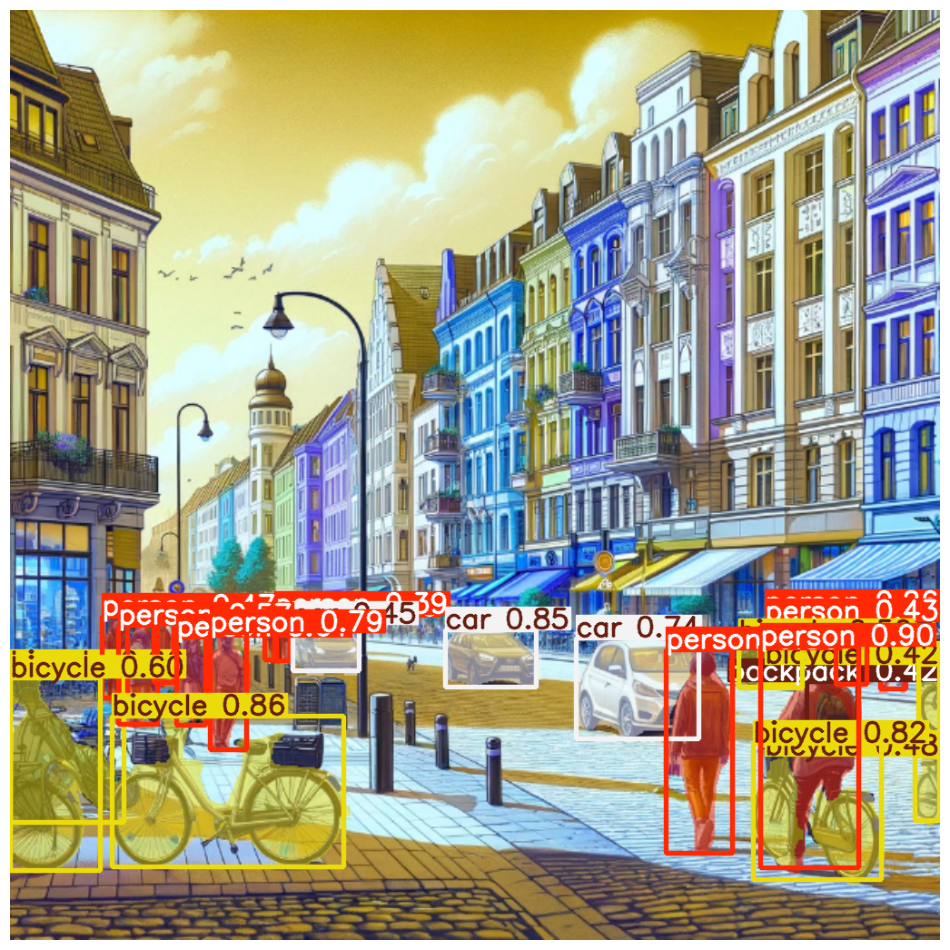

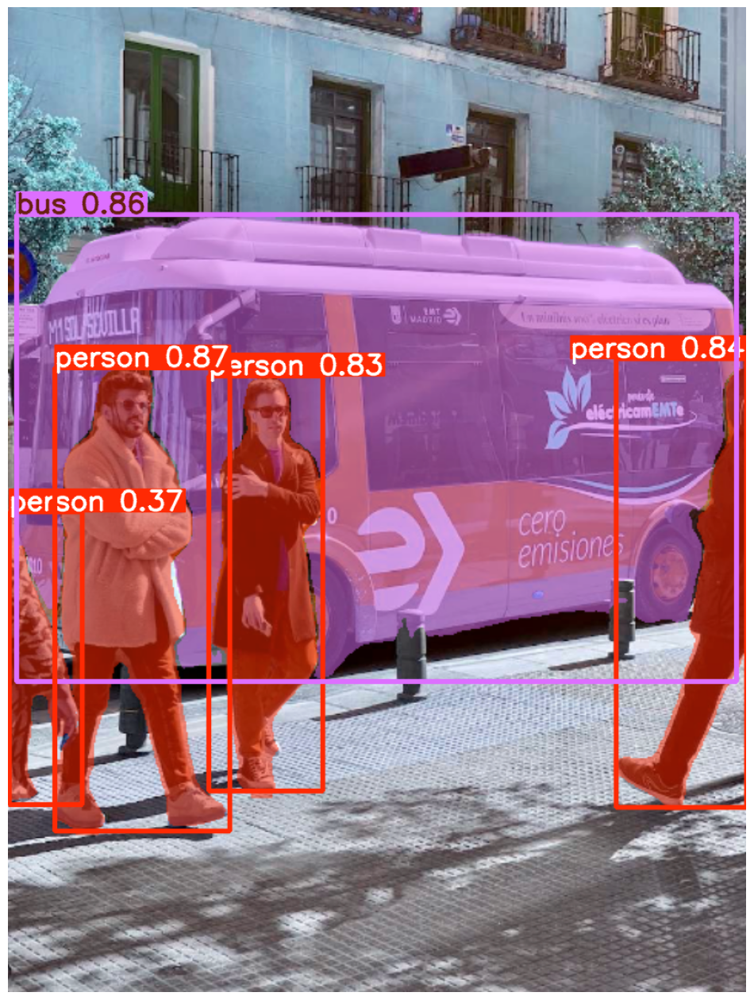

In [4]:
model = YOLO('yolo11n-seg.pt') 
image_paths = ["deteccion_objetos.jpg", "bus.jpg"]
results = model(image_paths)
for i,result in enumerate(results):
    image_with_boxes = results[i].plot()
    plt.figure(figsize=(12, 20)) 
    plt.imshow(image_with_boxes)
    plt.axis("off") 
    plt.show()

## EJERCICIO 4
De manera similar, podemos hacer la estimación de pose. Hazlo con las imágenes con las que estamos trabajando.

100%|██████████| 5.97M/5.97M [00:06<00:00, 947kB/s] 

0: 640x640 2 persons, 103.1ms
1: 640x640 4 persons, 103.1ms
Speed: 3.3ms preprocess, 103.1ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


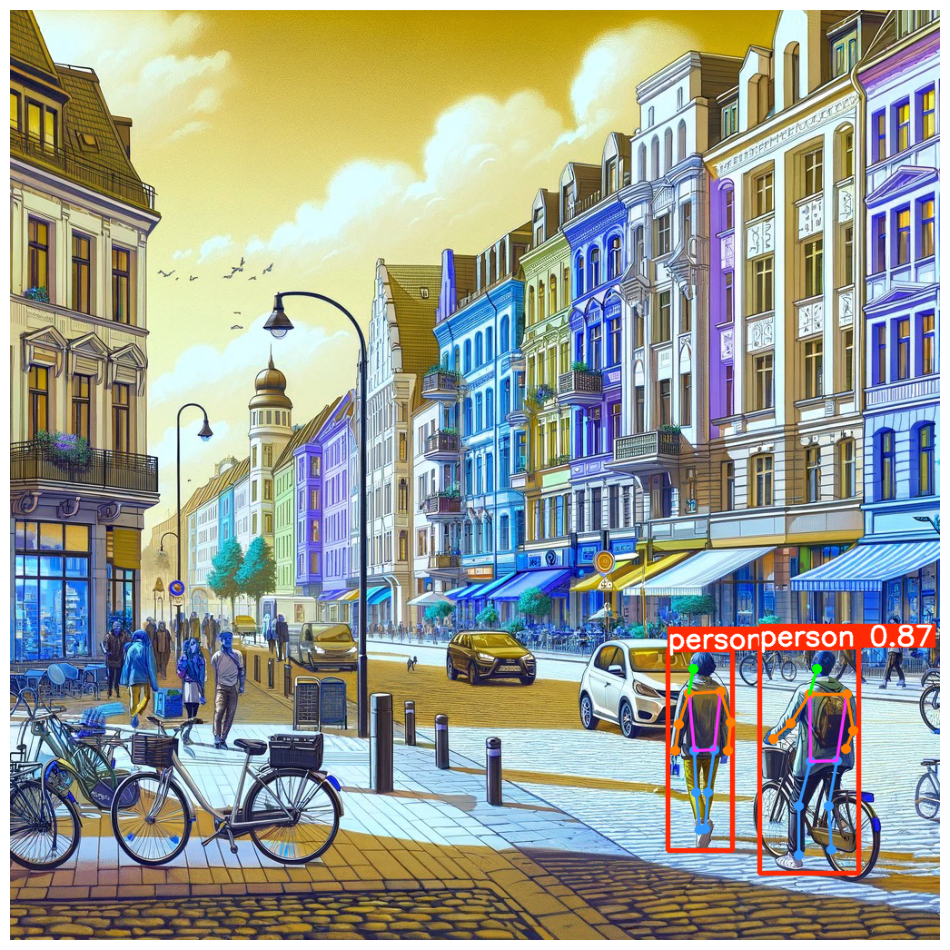

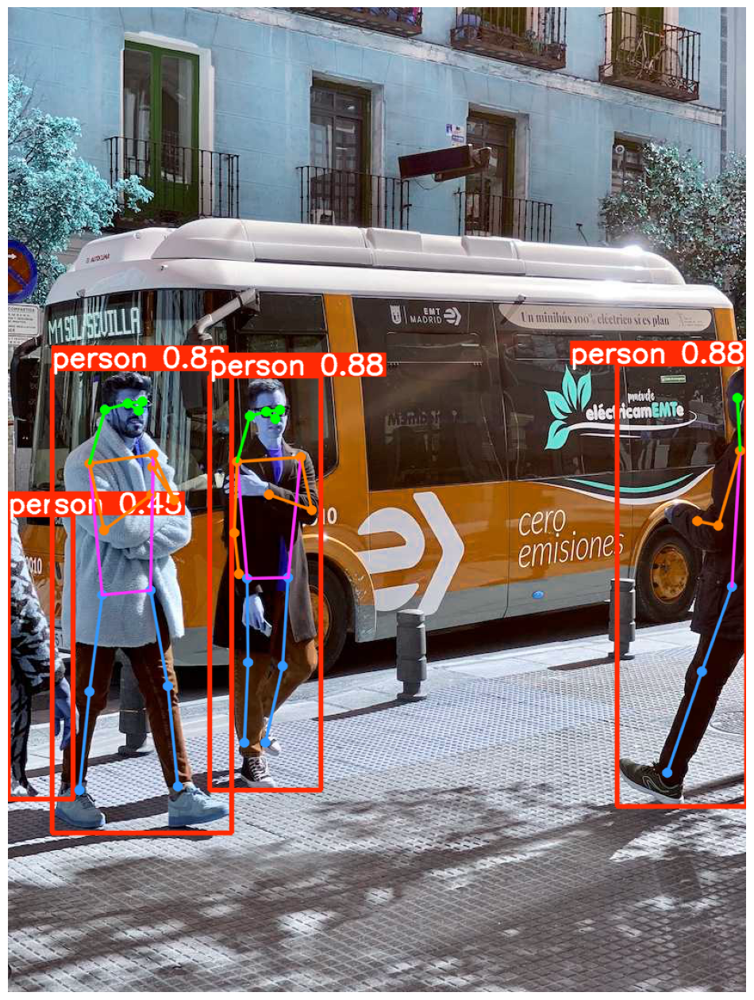

In [5]:
model = YOLO('yolo11n-pose.pt') 
image_paths = ["deteccion_objetos.jpg", "bus.jpg"]
results = model(image_paths)
for i,result in enumerate(results):
    image_with_boxes = results[i].plot()
    plt.figure(figsize=(12, 20)) 
    plt.imshow(image_with_boxes)
    plt.axis("off") 
    plt.show()

## EJERCICIO 5
Haz lo que se hace en el siguiente video:

https://www.youtube.com/watch?v=_YbEna8UNcU

Tienes parte del código en:

https://www.albertcoronado.com/2024/11/12/tutorial-yolo-11/

Para la parte fine tuning tienes que entrenar el modelo para que distina matrículas de coche, para entrenar el modelo utiliza el dataset que puedes descargar de:

https://universe.roboflow.com/parag-parmar-3qpin/car_license_plate-ypwmk/dataset/1

NOTA: HE CONSEGUIDO QUE FUNCIONE BIEN CV2 PERO ABRIENDO PRIMERO UNA IMAGEN:
```
img = cv2.imread('Datos/image3.jpg')
cv2.imshow("SAPA", img)
cv2.waitKey(0)
cv2.destroyAllWindows()
```


0: 640x480 1 cat, 112.0ms
Speed: 4.2ms preprocess, 112.0ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 480)


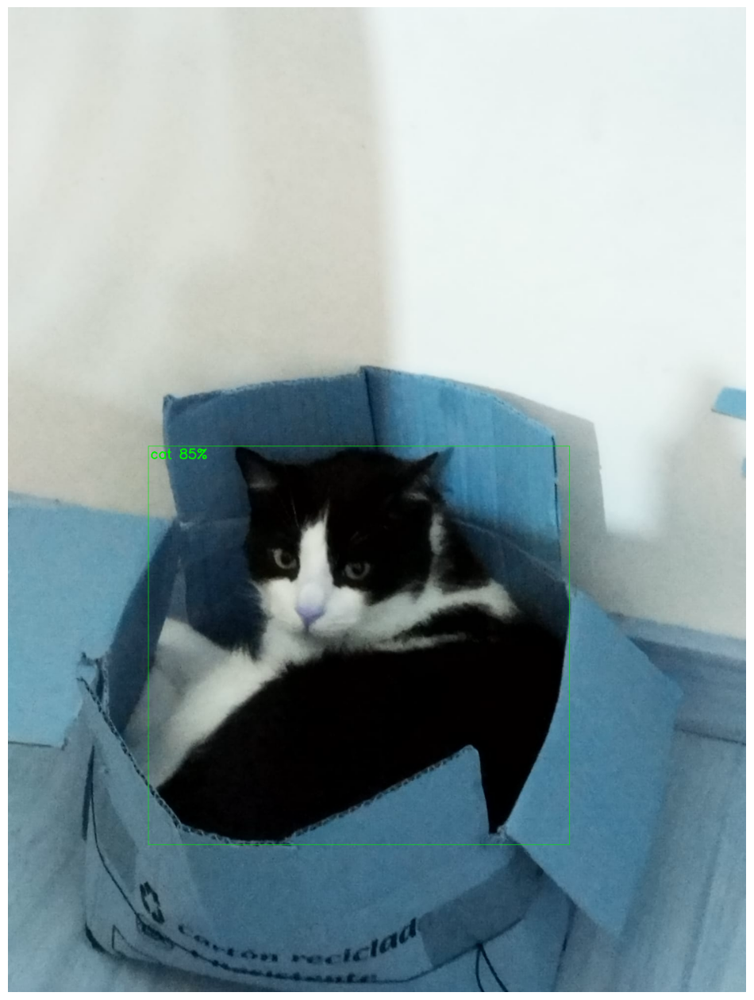

In [6]:
model = YOLO("yolo11n.pt")

font = cv2.FONT_HERSHEY_SIMPLEX
fontScale = 0.9
color = (0, 240, 0)
thickness = 2

img = cv2.imread('mika.jpg') 
results = model(img)

for r in results:
    for box in r.boxes:
        x1, y1, x2, y2 = box.xyxy[0]
        x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)
        confidence = math.ceil((box.conf[0]*100))
        cv2.rectangle(img, ( x1, y1 ), ( x2, y2 ), color, 1)
        cv2.putText(img, r.names[ int( box.cls[0] ) ]+" "+str(confidence)+"%", [ x1+4, y1+25 ], font, fontScale, color, thickness)

cv2.imwrite('resultado.jpg', img)

plt.figure(figsize=(12, 20)) 
plt.imshow(img)
plt.axis("off") 
plt.show()

In [7]:

model = YOLO("yolo11x.pt")
cap = cv2.VideoCapture(0)

font = cv2.FONT_HERSHEY_SIMPLEX
fontScale = 0.7
color = (0, 250, 0)
thickness = 2

while True:
    success, img = cap.read()
    results = model( img, stream=True )

    for r in results:
        for box in r.boxes:
            x1, y1, x2, y2 = box.xyxy[0]
            x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)

            confidence = math.ceil((box.conf[0]*100))
            
            cv2.rectangle(img, ( x1, y1 ), ( x2, y2 ), color, 1)
            cv2.putText(img, r.names[ int( box.cls[0] ) ]+" "+str(confidence)+"%", [ x1+4, y1+25 ], font, fontScale, color, thickness)

    cv2.imshow('Webcam', img)

    if cv2.waitKey(1) == ord('q'):
        break

cap.release()
cv2.destroyAllWindows()

100%|██████████| 109M/109M [01:20<00:00, 1.43MB/s] 



0: 480x640 (no detections), 675.8ms
Speed: 1.6ms preprocess, 675.8ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)



qt.qpa.plugin: Could not find the Qt platform plugin "wayland" in "/home/iabd/miniconda3/envs/iabd/lib/python3.9/site-packages/cv2/qt/plugins"
QObject::moveToThread: Current thread (0x42193600) is not the object's thread (0x46f15cf0).
Cannot move to target thread (0x42193600)

QObject::moveToThread: Current thread (0x42193600) is not the object's thread (0x46f15cf0).
Cannot move to target thread (0x42193600)

QObject::moveToThread: Current thread (0x42193600) is not the object's thread (0x46f15cf0).
Cannot move to target thread (0x42193600)

QObject::moveToThread: Current thread (0x42193600) is not the object's thread (0x46f15cf0).
Cannot move to target thread (0x42193600)

QObject::moveToThread: Current thread (0x42193600) is not the object's thread (0x46f15cf0).
Cannot move to target thread (0x42193600)

QObject::moveToThread: Current thread (0x42193600) is not the object's thread (0x46f15cf0).
Cannot move to target thread (0x42193600)

QObject::moveToThread: Current thread (0x421936

0: 480x640 (no detections), 674.5ms
Speed: 1.6ms preprocess, 674.5ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 (no detections), 596.3ms
Speed: 1.8ms preprocess, 596.3ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 (no detections), 573.8ms
Speed: 1.4ms preprocess, 573.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 (no detections), 559.1ms
Speed: 1.4ms preprocess, 559.1ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 (no detections), 585.5ms
Speed: 1.2ms preprocess, 585.5ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 (no detections), 563.9ms
Speed: 1.3ms preprocess, 563.9ms inference, 0.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 (no detections), 582.8ms
Speed: 1.7ms preprocess, 582.8ms inference, 0.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 (no detections), 578.0ms
Speed: 1.9ms prepro

## EJERCICIO 6
Repite el fine tuning del apartado anterior pero ahora en vez de como un comando en la terminal con código de python

In [ ]:
model = ultralytics.YOLO("yolo/yolo11s.pt")

model.train(data=r"/home/iabd/Escritorio/SAPA/SAPA/Aprendizajenosupervisado/5_5/car_plates/data.yaml", 
           imgsz=400,
           batch=10,
           epochs=25,             
           device='cpu') 


100%|██████████| 18.4M/18.4M [00:07<00:00, 2.54MB/s]


New https://pypi.org/project/ultralytics/8.3.77 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.74 🚀 Python-3.9.21 torch-2.6.0+cu124 CPU (Intel Core(TM) Ultra 9 185H)
engine/trainer: task=detect, mode=train, model=yolo/yolo11s.pt, data=/home/iabd/Escritorio/SAPA/SAPA/Aprendizaje no supervisado/5_5/car_plates/data.yaml, epochs=1, time=None, patience=100, batch=10, imgsz=400, save=True, save_period=-1, cache=False, device=cpu, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, class

100%|██████████| 755k/755k [00:00<00:00, 1.80MB/s]
E0000 00:00:1739985285.540350    5504 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1739985285.555759    5504 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  3                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
  4                  -1  1    103360  ultralytics.nn.modules.block.C3k2            [128, 256, 1, False, 0.25]    
  5                  -1  1    590336  ultralytics.nn.modules.conv.Conv             [256, 256, 3, 2]              
  6                  -1  1    346112  ultralytics.nn.modules.block.C3k2            [256, 256, 1, True]           
  7                  -1  1   1180672  ultralytics

train: Scanning /home/iabd/Escritorio/SAPA/SAPA/Aprendizaje no supervisado/5_5/car_plates/train/labels... 210 images, 0 backgrounds, 0 corrupt: 100%|██████████| 210/210 [00:00<00:00, 1313.84it/s]

train: New cache created: /home/iabd/Escritorio/SAPA/SAPA/Aprendizaje no supervisado/5_5/car_plates/train/labels.cache



val: Scanning /home/iabd/Escritorio/SAPA/SAPA/Aprendizaje no supervisado/5_5/car_plates/valid/labels... 60 images, 0 backgrounds, 0 corrupt: 100%|██████████| 60/60 [00:00<00:00, 1199.39it/s]

val: New cache created: /home/iabd/Escritorio/SAPA/SAPA/Aprendizaje no supervisado/5_5/car_plates/valid/labels.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.00046875), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 416 train, 416 val
Using 0 dataloader workers
Logging results to runs/detect/train
Starting training for 1 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/1         0G      1.665      3.698      1.315         15        416: 100%|██████████| 21/21 [00:36<00:00,  1.75s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:04<00:00,  1.49s/it]


                   all         60         64      0.581      0.594      0.516      0.225

1 epochs completed in 0.013 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 19.1MB
Optimizer stripped from runs/detect/train/weights/best.pt, 19.1MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.74 🚀 Python-3.9.21 torch-2.6.0+cu124 CPU (Intel Core(TM) Ultra 9 185H)
YOLO11s summary (fused): 238 layers, 9,413,187 parameters, 0 gradients, 21.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:04<00:00,  1.54s/it]


                   all         60         64       0.58      0.594      0.516      0.224
Speed: 0.5ms preprocess, 63.7ms inference, 0.0ms loss, 8.6ms postprocess per image
Results saved to runs/detect/train


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x71202abc6460>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 

In [ ]:
model = ultralytics.YOLO(r'/home/iabd/Escritorio/SAPA/SAPA/Aprendizajenosupervisado/5_5/runs/detect/train/weights/best.pt')  

img = r'carTest.jpg'

results = model(img)  
results[0].show()



image 1/1 /home/iabd/Escritorio/SAPA/SAPA/Aprendizaje no supervisado/5_5/carTest.jpg: 416x416 1 licence, 135.8ms
Speed: 2.0ms preprocess, 135.8ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 416)


Se está abriendo en una sesión de navegador existente.


## EJERCICIO 7
Vamos a contar los pasajeros de un autobus.

Sigue las instrucciones del siguiente video:

https://www.youtube.com/watch?v=hTI0Aj__SLE

ELIMINA LOS COMENTARIOS QUE HAY EN EL CÓDIGO Y COMENTA EL CÓDIGO CON TUS PROPIAS PALABRAS


In [10]:
from ultralytics.solutions.solutions import BaseSolution
from ultralytics.utils.plotting import Annotator, colors
import csv
from datetime import datetime
import os


class ObjectCounter(BaseSolution):
    """
    A class to manage the counting of objects in a real-time video stream based on their tracks.

    This class extends the BaseSolution class and provides functionality for counting objects moving in and out of a
    specified region in a video stream. It supports both polygonal and linear regions for counting.

    Attributes:
        in_count (int): Counter for objects moving inward.
        out_count (int): Counter for objects moving outward.
        counted_ids (List[int]): List of IDs of objects that have been counted.
        saved_ids (List[int]): List of IDs of objects that have been saved to the CSV file.
        classwise_counts (Dict[str, Dict[str, int]]): Dictionary for counts, categorized by object class.
        region_initialized (bool): Flag indicating whether the counting region has been initialized.
        show_in (bool): Flag to control display of inward count.
        show_out (bool): Flag to control display of outward count.
    """

    def __init__(self, **kwargs):
        """Initializes the ObjectCounter class for real-time object counting in video streams."""
        super().__init__(**kwargs)

        self.in_count = 0  # Contador de objetos que se mueven hacia adentro
        self.out_count = 0  # Contador de objetos que se mueven hacia afuera
        self.counted_ids = []  # Lista de IDs de objetos ya contados
        self.saved_ids = []  # Lista de IDs ya guardados en el archivo CSV
        self.classwise_counts = {}  # Diccionario para conteos, categorizados por clase de objeto
        self.region_initialized = False  # Booleano para la inicialización de la región

        self.show_in = self.CFG.get("show_in", True)
        self.show_out = self.CFG.get("show_out", True)

    def save_label_to_csv(self, track_id, label, action):
        """Save the label, track_id, action, and current time to a new CSV file with the current date."""
        if track_id in self.saved_ids:
            return  # Ignorar guardar el ID si ya está en la lista

        current_time = datetime.now().strftime("%Y-%m-%d %H:%M:%S")
        current_date = datetime.now().strftime("%Y-%m-%d")  # Fecha actual en el formato correcto

        # Crear nombre de archivo con la fecha actual
        filename = f'tracked_objects_{current_date}.csv'

        # Verificar si el archivo existe, si es así, escribir otro nombre
        file_exists = os.path.isfile(filename)

        with open(filename, mode='a', newline='') as file:
            writer = csv.writer(file)

            # Si el archivo no existe, escribir encabezados
            if not file_exists:
                writer.writerow(['track_id', 'label', 'action', 'date', 'time'])

            # Escribir datos con el ID actual
            writer.writerow([track_id, label, action, current_time.split()[0], current_time.split()[1]])
            self.saved_ids.append(track_id)  # Marcar el ID como guardado

    def count_objects(self, current_centroid, track_id, prev_position, cls):
        """
        Counts objects within a polygonal or linear region based on their tracks.

        Args:
            current_centroid (Tuple[float, float]): Current centroid values in the current frame.
            track_id (int): Unique identifier for the tracked object.
            prev_position (Tuple[float, float]): Last frame position coordinates (x, y) of the track.
            cls (int): Class index for classwise count updates.
        """
        if prev_position is None or track_id in self.counted_ids:
            return

        action = None  # Por defecto es None

        if len(self.region) == 2:  # Región lineal
            line = self.LineString(self.region)
            if line.intersects(self.LineString([prev_position, current_centroid])):
                if abs(self.region[0][0] - self.region[1][0]) < abs(self.region[0][1] - self.region[1][1]):
                    if current_centroid[0] > prev_position[0]:  # Moviéndose a la derecha
                        self.in_count += 1
                        self.classwise_counts[self.names[cls]]["IN"] += 1
                        action = "IN"
                    else:  # Moviéndose a la izquierda
                        self.out_count += 1
                        self.classwise_counts[self.names[cls]]["OUT"] += 1
                        action = "OUT"
                else:
                    if current_centroid[1] > prev_position[1]:  # Moviéndose hacia abajo
                        self.in_count += 1
                        self.classwise_counts[self.names[cls]]["IN"] += 1
                        action = "IN"
                    else:  # Moviéndose hacia arriba
                        self.out_count += 1
                        self.classwise_counts[self.names[cls]]["OUT"] += 1
                        action = "OUT"
                self.counted_ids.append(track_id)

        elif len(self.region) > 2:  # Región poligonal
            polygon = self.Polygon(self.region)
            if polygon.contains(self.Point(current_centroid)):
                region_width = max([p[0] for p in self.region]) - min([p[0] for p in self.region])
                region_height = max([p[1] for p in self.region]) - min([p[1] for p in self.region])

                if region_width < region_height:
                    if current_centroid[0] > prev_position[0]:  # Moviéndose a la derecha
                        self.in_count += 1
                        self.classwise_counts[self.names[cls]]["IN"] += 1
                        action = "IN"
                    else:  # Moviéndose a la izquierda
                        self.out_count += 1
                        self.classwise_counts[self.names[cls]]["OUT"] += 1
                        action = "OUT"
                else:
                    if current_centroid[1] > prev_position[1]:  # Moviéndose hacia abajo
                        self.in_count += 1
                        self.classwise_counts[self.names[cls]]["IN"] += 1
                        action = "IN"
                    else:  # Moviéndose hacia arriba
                        self.out_count += 1
                        self.classwise_counts[self.names[cls]]["OUT"] += 1
                        action = "OUT"
                self.counted_ids.append(track_id)

        # Guardar la etiqueta y la acción
        if action:
            label = f"{self.names[cls]} ID: {track_id}"
            self.save_label_to_csv(track_id, label, action)

    def store_classwise_counts(self, cls):
        """Initialize class-wise counts for a specific object class if not already present."""
        if self.names[cls] not in self.classwise_counts:
            self.classwise_counts[self.names[cls]] = {"IN": 0, "OUT": 0}

    def display_counts(self, im0):
        """Displays object counts on the input image or frame."""
        labels_dict = {
            str.capitalize(key): f"{'IN ' + str(value['IN']) if self.show_in else ''} "
            f"{'OUT ' + str(value['OUT']) if self.show_out else ''}".strip()
            for key, value in self.classwise_counts.items()
            if value["IN"] != 0 or value["OUT"] != 0
        }

        if labels_dict:
            self.annotator.display_analytics(im0, labels_dict, (104, 31, 17), (255, 255, 255), 10)

        for track_id in self.track_ids:
            if track_id in self.counted_ids:
                in_count = self.in_count
                label = f"ID:{track_id} count at number {in_count}"
                self.annotator.box_label(self.boxes[self.track_ids.index(track_id)], label=label, color=(255, 255, 0))

    def count(self, im0):
        """Processes input data (frames or object tracks) and updates object counts."""
        if not self.region_initialized:
            self.initialize_region()
            self.region_initialized = True

        self.annotator = Annotator(im0, line_width=self.line_width)
        self.extract_tracks(im0)
        self.annotator.draw_region(reg_pts=self.region, color=(104, 0, 123), thickness=self.line_width * 2)

        for box, track_id, cls in zip(self.boxes, self.track_ids, self.clss):
            self.store_tracking_history(track_id, box)
            self.store_classwise_counts(cls)

            label = f"{self.names[cls]} ID: {track_id}"
            self.annotator.box_label(box, label=label, color=colors(cls, True))

            current_centroid = ((box[0] + box[2]) / 2, (box[1] + box[3]) / 2)
            prev_position = self.track_history[track_id][-2] if len(self.track_history[track_id]) > 1 else None
            self.count_objects(current_centroid, track_id, prev_position, cls)

        self.display_counts(im0)
        self.display_output(im0)

        return im0

In [11]:
def RGB(event, x, y, flags, param):
    if event == cv2.EVENT_MOUSEMOVE:
        point = [x, y]
        print(f"Mouse moved to: {point}")

cap = cv2.VideoCapture('1.mp4')

region_points = [(386, 103), (458, 499)]

counter = ObjectCounter(
    region=region_points,
    model="yolo11s.pt",
    classes=[0],
    show_in=True,
    show_out=True,
    line_width=2,
)

cv2.namedWindow('RGB')
cv2.setMouseCallback('RGB', RGB)

count = 0

while True:
    ret, frame = cap.read()
    if not ret:
        break
    count += 1
    if count % 2 != 0:
        continue

    frame = cv2.resize(frame, (1020, 500))
    frame = counter.count(frame)
    cv2.imshow("RGB", frame)
    if cv2.waitKey(1) & 0xFF == ord("q"):
        break

cap.release()
cv2.destroyAllWindows()


Ultralytics Solutions: ✅ {'region': [(386, 103), (458, 499)], 'show_in': True, 'show_out': True, 'colormap': None, 'up_angle': 145.0, 'down_angle': 90, 'kpts': [6, 8, 10], 'analytics_type': 'line', 'json_file': None, 'records': 5, 'model': 'yolo11s.pt', 'classes': [0], 'line_width': 2}


100%|██████████| 18.4M/18.4M [00:00<00:00, 22.4MB/s]
QObject::moveToThread: Current thread (0x42193600) is not the object's thread (0x46f15cf0).
Cannot move to target thread (0x42193600)

QObject::moveToThread: Current thread (0x42193600) is not the object's thread (0x46f15cf0).
Cannot move to target thread (0x42193600)

QObject::moveToThread: Current thread (0x42193600) is not the object's thread (0x46f15cf0).
Cannot move to target thread (0x42193600)

QObject::moveToThread: Current thread (0x42193600) is not the object's thread (0x46f15cf0).
Cannot move to target thread (0x42193600)

QObject::moveToThread: Current thread (0x42193600) is not the object's thread (0x46f15cf0).
Cannot move to target thread (0x42193600)

QObject::moveToThread: Current thread (0x42193600) is not the object's thread (0x46f15cf0).
Cannot move to target thread (0x42193600)

QObject::moveToThread: Current thread (0x42193600) is not the object's thread (0x46f15cf0).
Cannot move to target thread (0x42193600)

QO


0: 320x640 6 persons, 194.4ms
Speed: 1.9ms preprocess, 194.4ms inference, 1.1ms postprocess per image at shape (1, 3, 320, 640)

0: 320x640 5 persons, 168.9ms
Speed: 2.3ms preprocess, 168.9ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 640)

0: 320x640 4 persons, 148.5ms
Speed: 2.3ms preprocess, 148.5ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 640)

0: 320x640 4 persons, 165.7ms
Speed: 3.0ms preprocess, 165.7ms inference, 1.8ms postprocess per image at shape (1, 3, 320, 640)

0: 320x640 4 persons, 144.7ms
Speed: 3.1ms preprocess, 144.7ms inference, 1.8ms postprocess per image at shape (1, 3, 320, 640)
Mouse moved to: [753, 53]
Mouse moved to: [752, 53]

0: 320x640 5 persons, 151.3ms
Speed: 3.2ms preprocess, 151.3ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 640)
Mouse moved to: [748, 57]

0: 320x640 5 persons, 173.0ms
Speed: 2.9ms preprocess, 173.0ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 640)

0: 320x640 5 perso

## EJERCICIO 8
Adapta el código anterior para que cuente vehículos en el video vehicle-counting.mp4 (tiene que contar por separado coches y camiones)

In [12]:
cap = cv2.VideoCapture('vehicle-counting.mp4')
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
print(f"Dimensiones del video: {width}x{height}")
cap.release()

def RGB(event, x, y, flags, param):
    if event == cv2.EVENT_MOUSEMOVE:
        point = [x, y]
        print(f"Mouse moved to: {point}")

cap = cv2.VideoCapture('vehicle-counting.mp4')
region_points = [(0, 255), (1019, 255)]

counter = ObjectCounter(
    region=region_points,
    model="yolo11s.pt",
    classes=[2, 7],
    show_in=True,
    show_out=True,
    line_width=2,
)

cv2.namedWindow('RGB')
cv2.setMouseCallback('RGB', RGB)

count = 0

while True:
    ret, frame = cap.read()
    if not ret:
        break

    count += 1
    if count % 2 != 0:
        continue

    frame = cv2.resize(frame, (1020, 500))
    frame = counter.count(frame)
    cv2.imshow("RGB", frame)
    if cv2.waitKey(1) & 0xFF == ord("q"):
        break

cap.release()
cv2.destroyAllWindows()


Dimensiones del video: 3840x2160
Ultralytics Solutions: ✅ {'region': [(0, 255), (1019, 255)], 'show_in': True, 'show_out': True, 'colormap': None, 'up_angle': 145.0, 'down_angle': 90, 'kpts': [6, 8, 10], 'analytics_type': 'line', 'json_file': None, 'records': 5, 'model': 'yolo11s.pt', 'classes': [2, 7], 'line_width': 2}


QObject::moveToThread: Current thread (0x42193600) is not the object's thread (0x46f15cf0).
Cannot move to target thread (0x42193600)

QObject::moveToThread: Current thread (0x42193600) is not the object's thread (0x46f15cf0).
Cannot move to target thread (0x42193600)

QObject::moveToThread: Current thread (0x42193600) is not the object's thread (0x46f15cf0).
Cannot move to target thread (0x42193600)

QObject::moveToThread: Current thread (0x42193600) is not the object's thread (0x46f15cf0).
Cannot move to target thread (0x42193600)

QObject::moveToThread: Current thread (0x42193600) is not the object's thread (0x46f15cf0).
Cannot move to target thread (0x42193600)

QObject::moveToThread: Current thread (0x42193600) is not the object's thread (0x46f15cf0).
Cannot move to target thread (0x42193600)

QObject::moveToThread: Current thread (0x42193600) is not the object's thread (0x46f15cf0).
Cannot move to target thread (0x42193600)

QObject::moveToThread: Current thread (0x42193600) is n


0: 320x640 4 cars, 1 truck, 166.6ms
Speed: 3.4ms preprocess, 166.6ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 640)
Mouse moved to: [272, 159]

0: 320x640 4 cars, 1 truck, 146.3ms
Speed: 2.1ms preprocess, 146.3ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 640)
Mouse moved to: [272, 153]

0: 320x640 4 cars, 1 truck, 148.1ms
Speed: 1.6ms preprocess, 148.1ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 640)

0: 320x640 4 cars, 1 truck, 152.0ms
Speed: 3.0ms preprocess, 152.0ms inference, 1.8ms postprocess per image at shape (1, 3, 320, 640)

0: 320x640 5 cars, 1 truck, 126.0ms
Speed: 2.1ms preprocess, 126.0ms inference, 0.9ms postprocess per image at shape (1, 3, 320, 640)


## EJERCICIO 9
Adapta el ejercicio anterior para que en vez de coches cuente matrículas usando el modelo que has creado en el ejercicio 6. 

Si el video del apartado anterior no te sirve porque no se ven bien las matrículas crea un video con la IA generativa (si el video creado es demasiado corto junta varios videos en uno)

In [ ]:
# Definir la función de callback del ratón
def RGB(event, x, y, flags, param):
    if event == cv2.EVENT_MOUSEMOVE:  # Comprobar el movimiento del ratón
        point = [x, y]
        print(f"Ratón movido a: {point}")

# Abrir el archivo de video
cap = cv2.VideoCapture('vehicle-counting.mp4')

# Definir puntos de la región para el conteo
region_points = [(0,500), (1020, 0)]

# Inicializar el contador de objetos
counter = ObjectCounter(
    region=region_points,  # Pasar los puntos de la región
    model=r'/home/iabd/Escritorio/SAPA/SAPA/Aprendizajenosupervisado/5_5/runs/detect/train/weights/best.pt',
    classes=[0],  # Detectar solo la clase matriculas
    show_in=True,  # Mostrar el conteo de entradas
    show_out=True,  # Mostrar el conteo de salidas
    line_width=2,  # Ajustar el grosor de la línea para la visualización
)

# Crear una ventana con nombre y establecer el callback del ratón
cv2.namedWindow('RGB')
cv2.setMouseCallback('RGB', RGB)

count = 0

while True:
    # Leer un fotograma del video
    ret, frame = cap.read()
    if not ret:
        break
        # Si el video termina, reiniciar al principio
    #cap.set(cv2.CAP_PROP_POS_FRAMES, 0)
    #continue
    count += 1
    if count % 2 != 0:  # Saltar los fotogramas impares
        continue

    frame = cv2.resize(frame, (1020, 500))

    # Procesar el fotograma con el contador de objetos
    frame = counter.count(frame)

    # Mostrar el fotograma
    cv2.imshow("RGB", frame)
    if cv2.waitKey(1) & 0xFF == ord("q"):  # Presionar 'q' para salir
        break

# Liberar el objeto de captura de video y cerrar la ventana de visualización
cap.release()
cv2.destroyAllWindows()

Ultralytics Solutions: ✅ {'region': [(0, 500), (1020, 0)], 'show_in': True, 'show_out': True, 'colormap': None, 'up_angle': 145.0, 'down_angle': 90, 'kpts': [6, 8, 10], 'analytics_type': 'line', 'json_file': None, 'records': 5, 'model': '/home/iabd/Escritorio/SAPA/SAPA/Aprendizaje no supervisado/5_5/runs/detect/train/weights/best.pt', 'classes': [0], 'line_width': 2}


QObject::moveToThread: Current thread (0x42193600) is not the object's thread (0x46f15cf0).
Cannot move to target thread (0x42193600)

QObject::moveToThread: Current thread (0x42193600) is not the object's thread (0x46f15cf0).
Cannot move to target thread (0x42193600)

QObject::moveToThread: Current thread (0x42193600) is not the object's thread (0x46f15cf0).
Cannot move to target thread (0x42193600)

QObject::moveToThread: Current thread (0x42193600) is not the object's thread (0x46f15cf0).
Cannot move to target thread (0x42193600)

QObject::moveToThread: Current thread (0x42193600) is not the object's thread (0x46f15cf0).
Cannot move to target thread (0x42193600)

QObject::moveToThread: Current thread (0x42193600) is not the object's thread (0x46f15cf0).
Cannot move to target thread (0x42193600)

QObject::moveToThread: Current thread (0x42193600) is not the object's thread (0x46f15cf0).
Cannot move to target thread (0x42193600)

QObject::moveToThread: Current thread (0x42193600) is n


0: 224x416 (no detections), 126.9ms
Speed: 3.6ms preprocess, 126.9ms inference, 1.1ms postprocess per image at shape (1, 3, 224, 416)
WARNING ⚠️ no tracks found!

0: 224x416 (no detections), 70.7ms
Speed: 1.8ms preprocess, 70.7ms inference, 0.5ms postprocess per image at shape (1, 3, 224, 416)
WARNING ⚠️ no tracks found!

0: 224x416 (no detections), 73.4ms
Speed: 1.8ms preprocess, 73.4ms inference, 0.4ms postprocess per image at shape (1, 3, 224, 416)
WARNING ⚠️ no tracks found!

0: 224x416 (no detections), 69.5ms
Speed: 1.2ms preprocess, 69.5ms inference, 0.4ms postprocess per image at shape (1, 3, 224, 416)
WARNING ⚠️ no tracks found!

0: 224x416 (no detections), 76.0ms
Speed: 1.8ms preprocess, 76.0ms inference, 0.5ms postprocess per image at shape (1, 3, 224, 416)
WARNING ⚠️ no tracks found!

0: 224x416 (no detections), 95.8ms
Speed: 1.7ms preprocess, 95.8ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 416)
WARNING ⚠️ no tracks found!

0: 224x416 (no detections), 105

## EJERCICIO 10
Vamos a hacer fine tuning sobre el modelo para segmentación SAM-2.

Puedes sacar información de la siguiente página:

https://blog.roboflow.com/fine-tune-sam-2-1/

A la hora de conseguir el dataset, descargalo para no tener problemas con la API-KEY de Roboflow

In [19]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="lj7pM5FoHvTJsrCCDypm")
project = rf.workspace("irune").project("car-parts-pgo19-mkgyq")
version = project.version(1)
dataset = version.download("sam2")
                

  Using cached python_dotenv-1.0.1-py3-none-any.whl.metadata (23 kB)
  Using cached filetype-1.2.0-py2.py3-none-any.whl.metadata (6.5 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 30.7 MB/s eta 0:00:0000:0100:01
  Attempting uninstall: idna
    Found existing installation: idna 3.10
    Uninstalling idna-3.10:
      Successfully uninstalled idna-3.10
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Car-Parts-1 in sam2:: 100%|██████████| 104/104 [00:00<00:00, 5912.11it/s]


In [1]:
import torch
print(f"CUDA disponible: {torch.cuda.is_available()}")
print(f"GPU detectada: {torch.cuda.get_device_name(0) if torch.cuda.is_available() else 'Ninguna'}")

CUDA disponible: True
GPU detectada: NVIDIA GeForce RTX 4080 Laptop GPU


In [21]:
!git clone https://github.com/facebookresearch/sam2.git
!wget -O /home/iabd/Escritorio/SAPA/SAPA/Aprendizajenosupervisado/5_5/sam2/sam2/configs/train.yaml 'https://drive.usercontent.google.com/download?id=11cmbxPPsYqFyWq87tmLgBAQ6OZgEhPG3'

fatal: la ruta de destino 'sam2' ya existe y no es un directorio vacío.
--2025-02-19 20:23:01--  https://drive.usercontent.google.com/download?id=11cmbxPPsYqFyWq87tmLgBAQ6OZgEhPG3
Resolviendo drive.usercontent.google.com (drive.usercontent.google.com)... 172.217.17.1, 2a00:1450:4003:80e::2001
Conectando con drive.usercontent.google.com (drive.usercontent.google.com)[172.217.17.1]:443... conectado.
Petición HTTP enviada, esperando respuesta... 200 OK
Longitud: 11055 (11K) [application/octet-stream]
Guardando como: ‘/home/iabd/Escritorio/SAPA/SAPA/Aprendizajenosupervisado/5_5/sam2/sam2/configs/train.yaml’

/home/iabd/Escritor 100%[===================>]  10,80K  --.-KB/s    en 0,001s  

2025-02-19 20:23:03 (7,60 MB/s) - ‘/home/iabd/Escritorio/SAPA/SAPA/Aprendizajenosupervisado/5_5/sam2/sam2/configs/train.yaml’ guardado [11055/11055]



In [ ]:
%cd ./sam2/
!pip install -e .[dev]
!pip install supervision -q

Clonando en 'sam2'...
remote: Enumerating objects: 1070, done.
remote: Total 1070 (delta 0), reused 0 (delta 0), pack-reused 1070 (from 1)
Recibiendo objetos: 100% (1070/1070), 134.70 MiB | 16.77 MiB/s, listo.
Resolviendo deltas: 100% (376/376), listo.
--2025-02-19 20:03:06--  https://drive.usercontent.google.com/download?id=11cmbxPPsYqFyWq87tmLgBAQ6OZgEhPG3
Resolviendo drive.usercontent.google.com (drive.usercontent.google.com)... 142.250.200.65, 2a00:1450:4003:80d::2001
Conectando con drive.usercontent.google.com (drive.usercontent.google.com)[142.250.200.65]:443... conectado.
Petición HTTP enviada, esperando respuesta... 200 OK
Longitud: 11055 (11K) [application/octet-stream]
Guardando como: ‘/home/iabd/Escritorio/SAPA/SAPA/Aprendizajenosupervisado/5_5/sam2/sam2/configs/train.yaml’

/home/iabd/Escritor 100%[===================>]  10,80K  --.-KB/s    en 0s      

2025-02-19 20:03:08 (112 MB/s) - ‘/home/iabd/Escritorio/SAPA/SAPA/Aprendizajenosupervisado/5_5/sam2/sam2/configs/train.yam

In [3]:
!cd ./checkpoints && ./download_ckpts.sh

--2025-02-19 20:04:16--  https://dl.fbaipublicfiles.com/segment_anything_2/092824/sam2.1_hiera_tiny.pt
Resolviendo dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 18.154.41.12, 18.154.41.57, 18.154.41.8, ...
Conectando con dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)[18.154.41.12]:443... conectado.
Petición HTTP enviada, esperando respuesta... 200 OK
Longitud: 156008466 (149M) [application/vnd.snesdev-page-table]
Guardando como: ‘sam2.1_hiera_tiny.pt’

sam2.1_hiera_tiny.p 100%[===================>] 148,78M  43,0MB/s    en 3,8s    

2025-02-19 20:04:20 (39,6 MB/s) - ‘sam2.1_hiera_tiny.pt’ guardado [156008466/156008466]

--2025-02-19 20:04:20--  https://dl.fbaipublicfiles.com/segment_anything_2/092824/sam2.1_hiera_small.pt
Resolviendo dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 18.154.41.8, 18.154.41.96, 18.154.41.57, ...
Conectando con dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)[18.154.41.8]:443... conectado.
Petición HTTP enviada, esperando respuesta... 200 OK
Longitud

In [4]:
from sam2.build_sam import build_sam2
from sam2.automatic_mask_generator import SAM2AutomaticMaskGenerator
import supervision as sv
import os
import random
from PIL import Image
import numpy as np


In [18]:
import os
import re

FOLDER = "/home/iabd/Escritorio/SAPA/SAPA/Aprendizajenosupervisado/5_5/Car Parts.v1i.sam2/train"

for filename in os.listdir(FOLDER):
    # Replace all except last dot with underscore
    new_filename = filename.replace(".", "_", filename.count(".") - 1)

    if not re.search(r"_\d+\.\w+$", new_filename):
        # Add an int to the end of base name
        new_filename = new_filename.replace(".", "_1.")

    os.rename(os.path.join(FOLDER, filename), os.path.join(FOLDER, new_filename))

In [15]:
!python training/train.py -c 'configs/train.yaml' --use-cluster 0 --num-gpus 1

###################### Train App Config ####################
scratch:
  resolution: 1024
  train_batch_size: 1
  num_train_workers: 10
  num_frames: 1
  max_num_objects: 3
  base_lr: 5.0e-06
  vision_lr: 3.0e-06
  phases_per_epoch: 1
  num_epochs: 40
dataset:
  img_folder: /content/data/train
  gt_folder: /content/data/train
  multiplier: 2
vos:
  train_transforms:
  - _target_: training.dataset.transforms.ComposeAPI
    transforms:
    - _target_: training.dataset.transforms.RandomHorizontalFlip
      consistent_transform: true
    - _target_: training.dataset.transforms.RandomAffine
      degrees: 25
      shear: 20
      image_interpolation: bilinear
      consistent_transform: true
    - _target_: training.dataset.transforms.RandomResizeAPI
      sizes: ${scratch.resolution}
      square: true
      consistent_transform: true
    - _target_: training.dataset.transforms.ColorJitter
      consistent_transform: true
      brightness: 0.1
      contrast: 0.03
      saturation: 0.03
   

In [17]:

# use bfloat16 for inference
# from Meta notebook
torch.autocast("cuda", dtype=torch.bfloat16).__enter__()
if torch.cuda.get_device_properties(0).major >= 8:
	torch.backends.cuda.matmul.allow_tf32 = True
	torch.backends.cudnn.allow_tf32 = True

checkpoint = "/home/iabd/Escritorio/SAPA/SAPA/Aprendizajenosupervisado/5_5/sam2/sam2/configs/train.yaml/checkpoints/checkpoint.pt"
model_cfg = "configs/sam2.1/sam2.1_hiera_b+.yaml"
sam2 = build_sam2(model_cfg, checkpoint, device="cuda")
mask_generator = SAM2AutomaticMaskGenerator(sam2)

checkpoint_base = "/home/iabd/Escritorio/SAPA/SAPA/Aprendizajenosupervisado/5_5/sam2/checkpoints/sam2.1_hiera_base_plus.pt"
model_cfg_base = "configs/sam2.1/sam2.1_hiera_b+.yaml"
sam2_base = build_sam2(model_cfg_base, checkpoint_base, device="cuda")
mask_generator_base = SAM2AutomaticMaskGenerator(sam2_base)

NotADirectoryError: [Errno 20] Not a directory: '/home/iabd/Escritorio/SAPA/SAPA/Aprendizajenosupervisado/5_5/sam2/sam2/configs/train.yaml/checkpoints/checkpoint.pt'

In [ ]:
validation_set = os.listdir("/home/iabd/Escritorio/SAPA/SAPA/Aprendizajenosupervisado/5_5/Car Parts.v1i.sam2/valid")

# choose random with .json extension
image = random.choice([img for img in validation_set if img.endswith(".jpg")])
image = os.path.join("/home/iabd/Escritorio/SAPA/SAPA/Aprendizajenosupervisado/5_5/Car Parts.v1i.sam2/valid", image)
opened_image = np.array(Image.open(image).convert("RGB"))
result = mask_generator.generate(opened_image)

detections = sv.Detections.from_sam(sam_result=result)

mask_annotator = sv.MaskAnnotator(color_lookup = sv.ColorLookup.INDEX)
annotated_image = opened_image.copy()
annotated_image = mask_annotator.annotate(annotated_image, detections=detections)

base_annotator = sv.MaskAnnotator(color_lookup = sv.ColorLookup.INDEX)

base_result = mask_generator_base.generate(opened_image)
base_detections = sv.Detections.from_sam(sam_result=base_result)
base_annotated_image = opened_image.copy()
base_annotated_image = base_annotator.annotate(base_annotated_image, detections=base_detections)

sv.plot_images_grid(images=[annotated_image, base_annotated_image], grid_size=(1, 2))

## EJERCICIO 11 (OPCIONAL)
Haz fine tuning con sam2 o yolo11 para segmentación con otro dataset 

## EJERCICIO 12 (OPCIONAL)
En el siguiente enlace encontraras diferentes modelos y trabajos sobre la visión por computación, prueba alguno de ellos (algunos que no funcionan porque las librerías se han actualizado y tienes que adaptarlos, otros son recientes y no deberías tener problemas).

https://github.com/roboflow/notebooks

ELIMINA LOS COMENTARIOS QUE HAY EN EL CÓDIGO Y COMENTA EL CÓDIGO CON TUS PROPIAS PALABRAS